In this notebook we learn on another important attack called HopSkipJump attack from Jianbo et al. (2019).
This is a powerful black-box attack that only requires final class prediction, and is an advanced version of the boundary attack.

# ART HopSkipJump Attack

In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

import sys
!{sys.executable} -m pip install git+https://github.com/nottombrown/imagenet_stubs
sys.path.append("..")

%matplotlib inline

import tensorflow as tf

tf.compat.v1.disable_eager_execution()

import imagenet_stubs
import numpy as np
import tensorflow.keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
import tensorflow.keras.backend as k
from matplotlib import pyplot as plt
from IPython.display import clear_output

from art.estimators.classification import KerasClassifier
from art.attacks.evasion import HopSkipJump
from art.utils import to_categorical

  Cloning https://github.com/nottombrown/imagenet_stubs to /private/var/folders/r2/hgg6__k90mg8pw2986s7qg680000gn/T/pip-req-build-v89fnl3s
  Running command git clone --filter=blob:none -q https://github.com/nottombrown/imagenet_stubs /private/var/folders/r2/hgg6__k90mg8pw2986s7qg680000gn/T/pip-req-build-v89fnl3s
  Resolved https://github.com/nottombrown/imagenet_stubs to commit 0b501276f54cbf45b8e1b67dccbdcbe51de88365
  Preparing metadata (setup.py) ... done


Using TensorFlow backend.


# Model Definition

In [2]:
mean_imagenet = np.zeros([224, 224, 3])
mean_imagenet[...,0].fill(103.939)
mean_imagenet[...,1].fill(116.779)
mean_imagenet[...,2].fill(123.68)
model = ResNet50(weights='imagenet')
classifier = KerasClassifier(clip_values=(0, 255), model=model, preprocessing=(mean_imagenet, np.ones([224, 224, 3])))

Instructions for updating:
Colocations handled automatically by placer.


# Get Target and Init Images

/opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:2458: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Target image is:  105


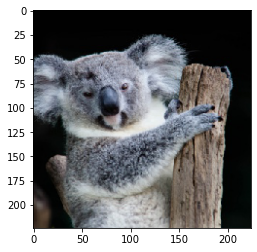

Init image is:  866


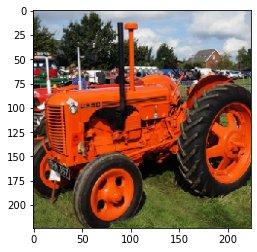

In [3]:
target_image_name = 'koala.jpg'
init_image_name = 'tractor.jpg'
for image_path in imagenet_stubs.get_image_paths():
    if image_path.endswith(target_image_name):
        target_image = image.load_img(image_path, target_size=(224, 224))
        target_image = image.img_to_array(target_image)
    if image_path.endswith(init_image_name):
        init_image = image.load_img(image_path, target_size=(224, 224))
        init_image = image.img_to_array(init_image)

print("Target image is: ", np.argmax(classifier.predict(np.array([target_image]))[0]))
plt.imshow(target_image.astype(np.uint))
plt.show()
print("Init image is: ", np.argmax(classifier.predict(np.array([init_image]))[0]))
plt.imshow(init_image.astype(np.uint))
plt.show()

# HopSkipJump Untargeted Attack

## Without Masking

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 14470.847 and class label 106.


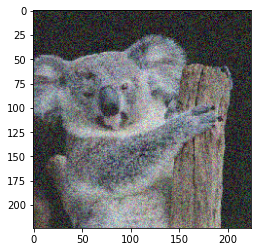

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 9033.865 and class label 106.


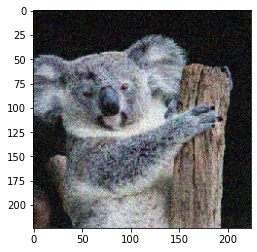

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 6539.421 and class label 106.


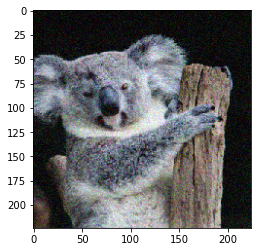

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 4873.5586 and class label 106.


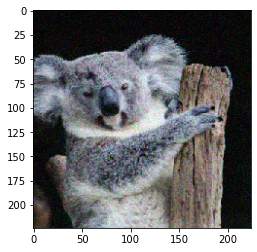

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 3753.113 and class label 106.


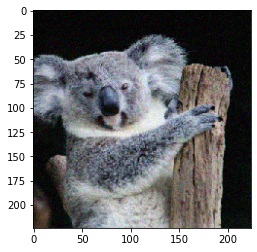

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 50. L2 error 2989.9795 and class label 106.


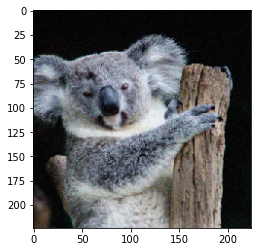

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 2576.9055 and class label 106.


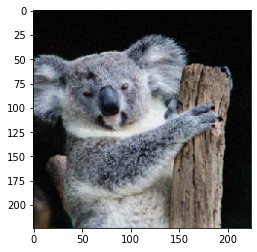

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 70. L2 error 2220.723 and class label 106.


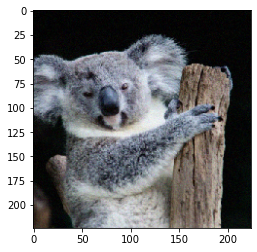

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 1923.1105 and class label 106.


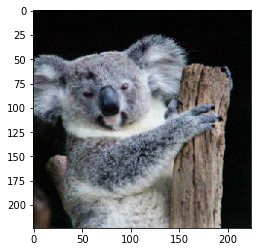

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 90. L2 error 1716.518 and class label 106.


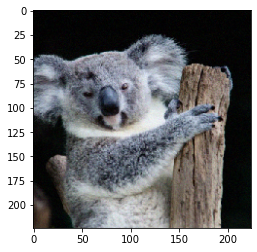

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 100. L2 error 1555.1082 and class label 106.


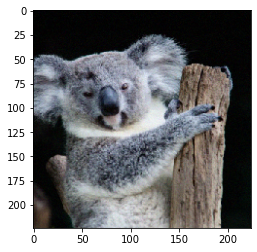

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 110. L2 error 1427.9027 and class label 106.


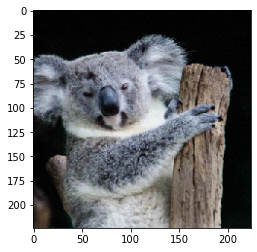

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 120. L2 error 1307.318 and class label 106.


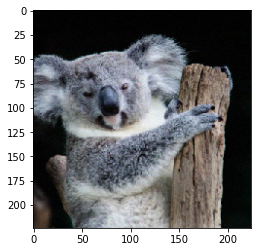

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 130. L2 error 1208.5579 and class label 106.


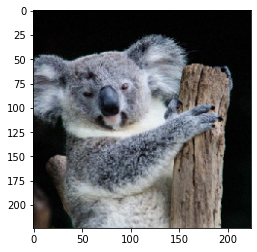

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 140. L2 error 1119.7686 and class label 106.


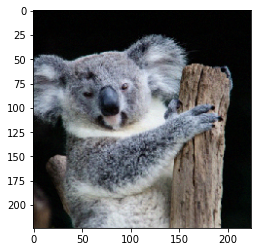

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 150. L2 error 1046.2781 and class label 106.


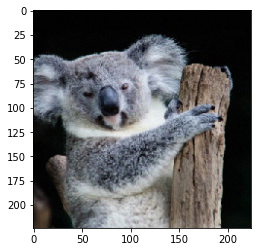

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 160. L2 error 979.2825 and class label 106.


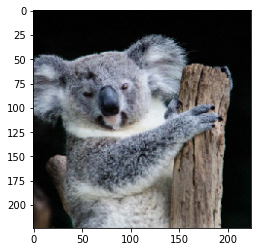

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 170. L2 error 920.9979 and class label 106.


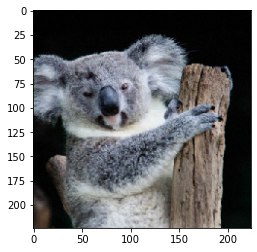

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 180. L2 error 868.933 and class label 106.


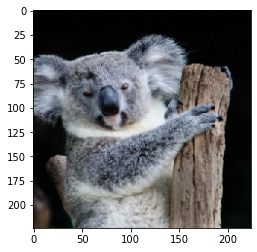

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 190. L2 error 822.3236 and class label 106.


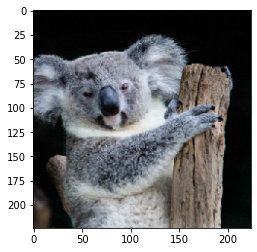

In [4]:
attack = HopSkipJump(classifier=classifier, targeted=False, max_iter=0, max_eval=1000, init_eval=10)
iter_step = 10
x_adv = None
for i in range(20):
    x_adv = attack.generate(x=np.array([target_image]), x_adv_init=x_adv, resume=True)

    #clear_output()
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
          "and class label %d." % np.argmax(classifier.predict(x_adv)[0]))
    plt.imshow(x_adv[0].astype(np.uint))
    plt.show(block=False)
    
    attack.max_iter = iter_step

## With Masking

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 12655.524 and class label 359.


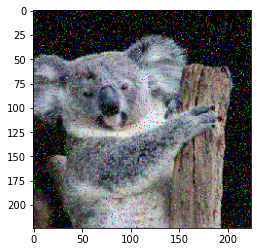

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 7272.0093 and class label 359.


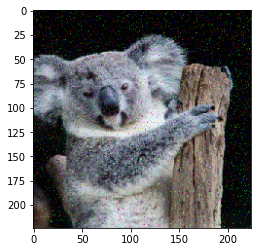

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 5293.7124 and class label 356.


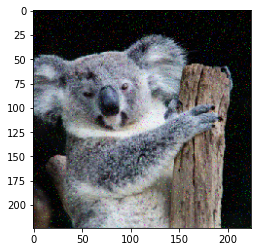

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 3905.725 and class label 356.


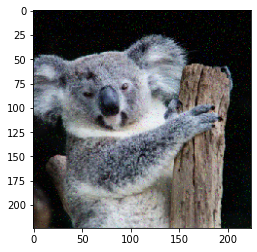

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 2925.3684 and class label 356.


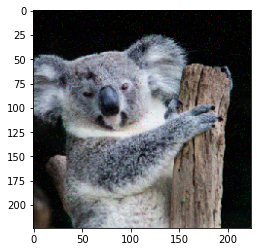

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 50. L2 error 2388.375 and class label 356.


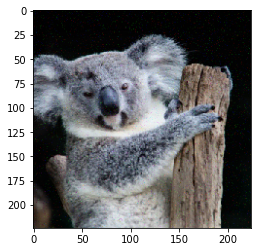

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 2026.6868 and class label 356.


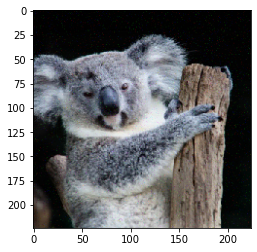

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 70. L2 error 1747.4108 and class label 356.


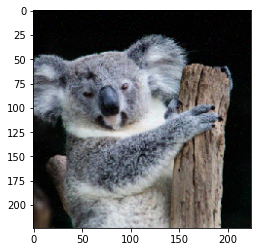

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 1527.6959 and class label 356.


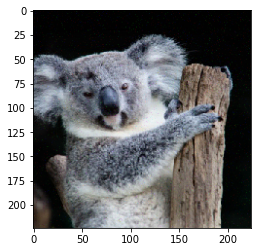

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 90. L2 error 1382.3685 and class label 356.


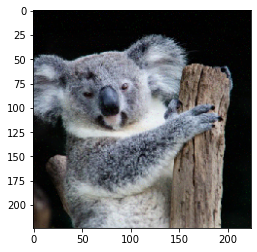

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 100. L2 error 1244.955 and class label 356.


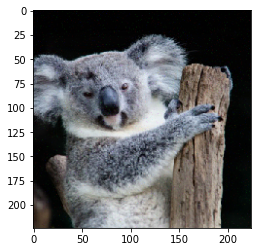

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 110. L2 error 1130.8732 and class label 356.


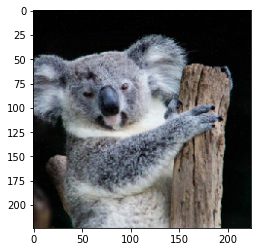

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 120. L2 error 1034.914 and class label 356.


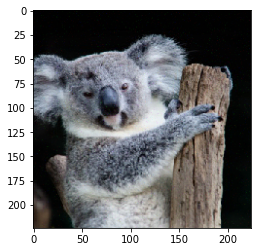

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 130. L2 error 947.5807 and class label 356.


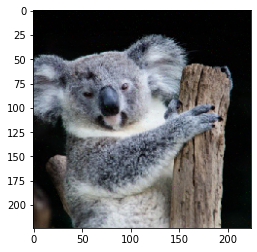

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 140. L2 error 879.5484 and class label 356.


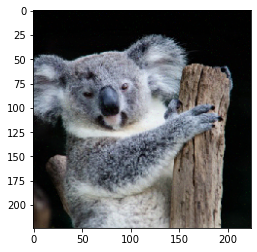

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 150. L2 error 823.4121 and class label 356.


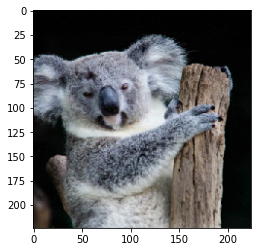

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 160. L2 error 777.95245 and class label 356.


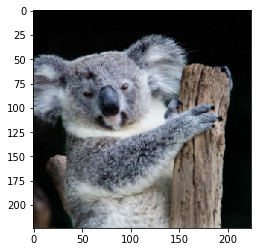

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 170. L2 error 736.01624 and class label 356.


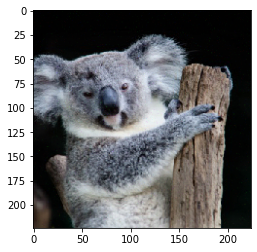

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 180. L2 error 700.8978 and class label 356.


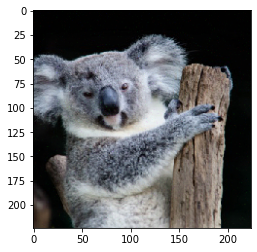

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 190. L2 error 670.53906 and class label 356.


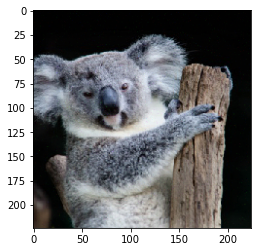

In [5]:
attack = HopSkipJump(classifier=classifier, targeted=False, max_iter=0, max_eval=1000, init_eval=10)
iter_step = 10
x_adv = None
mask = np.random.binomial(n=1, p=0.1, size=np.prod(target_image.shape))
mask = mask.reshape(target_image.shape)
for i in range(20):
    x_adv = attack.generate(x=np.array([target_image]), x_adv_init=x_adv, resume=True, mask=mask)

    #clear_output()
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
          "and class label %d." % np.argmax(classifier.predict(x_adv)[0]))
    plt.imshow(x_adv[0].astype(np.uint))
    plt.show(block=False)
    
    attack.max_iter = iter_step

# HopSkipJump Targeted Attack

## Without Masking

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 44399.297 and class label 866.


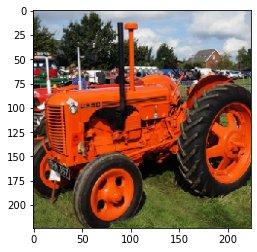

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 16210.736 and class label 866.


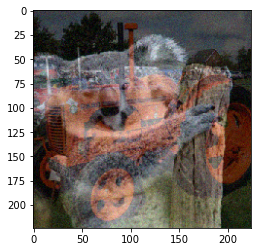

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 14393.196 and class label 866.


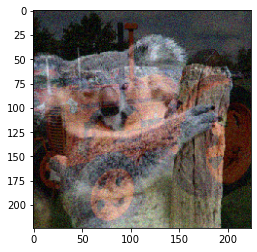

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 11752.318 and class label 866.


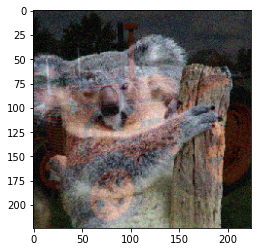

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 9890.75 and class label 866.


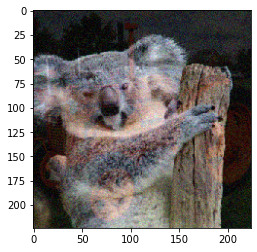

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 50. L2 error 8449.979 and class label 866.


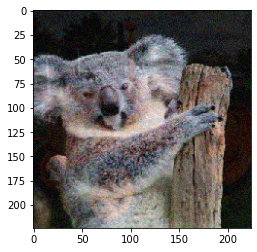

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 7309.157 and class label 866.


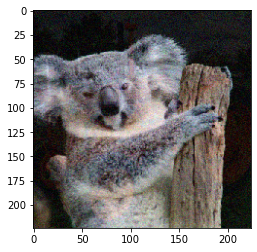

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 70. L2 error 6738.073 and class label 866.


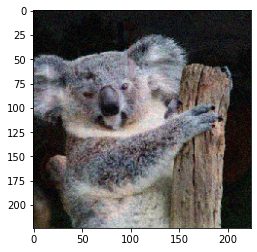

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 5625.198 and class label 866.


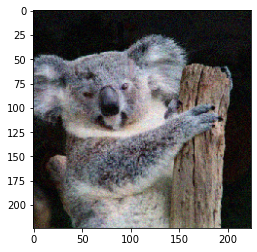

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 90. L2 error 4820.3096 and class label 866.


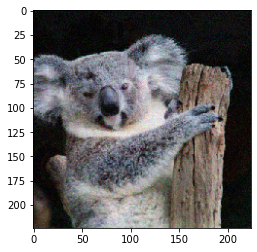

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 100. L2 error 4109.2188 and class label 866.


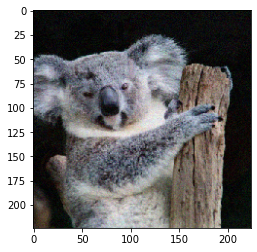

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 110. L2 error 3770.4722 and class label 866.


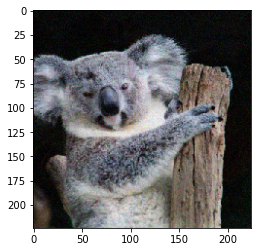

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 120. L2 error 3348.527 and class label 866.


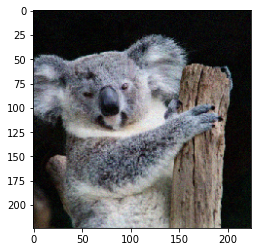

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 130. L2 error 3012.6816 and class label 866.


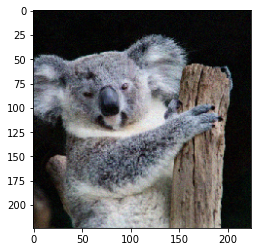

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 140. L2 error 2696.0486 and class label 866.


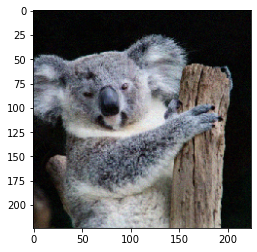

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 150. L2 error 2423.31 and class label 866.


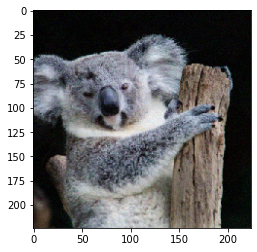

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 160. L2 error 2206.9424 and class label 866.


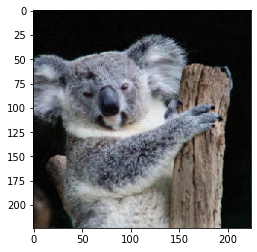

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 170. L2 error 2025.5371 and class label 866.


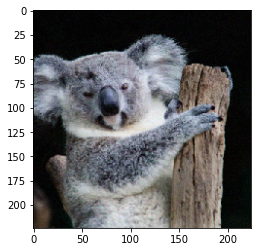

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 180. L2 error 1863.5614 and class label 866.


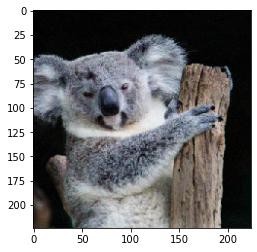

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 190. L2 error 1738.5591 and class label 866.


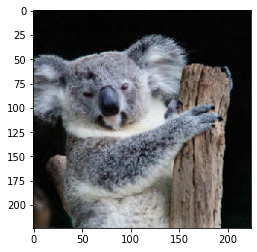

In [6]:
attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
iter_step = 10
x_adv = np.array([init_image])
for i in range(20):
    x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([866], 1000), x_adv_init=x_adv, resume=True)

    #clear_output()
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
          "and class label %d." % np.argmax(classifier.predict(x_adv)[0]))
    plt.imshow(x_adv[0].astype(np.uint))
    plt.show(block=False)
    
    attack.max_iter = iter_step

## With Masking

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 42102.027 and class label 866.


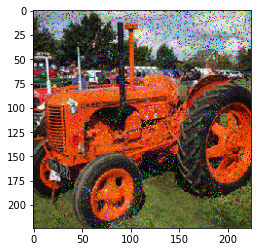

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 19345.496 and class label 866.


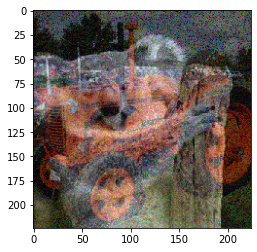

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 17326.287 and class label 866.


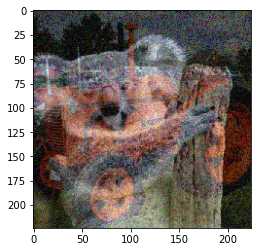

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 15256.058 and class label 866.


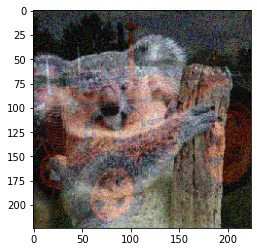

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 13486.752 and class label 866.


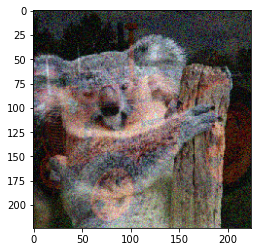

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 50. L2 error 11751.633 and class label 866.


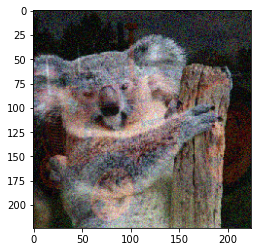

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 10940.977 and class label 866.


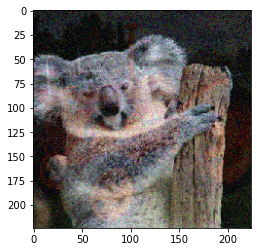

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 70. L2 error 9623.699 and class label 866.


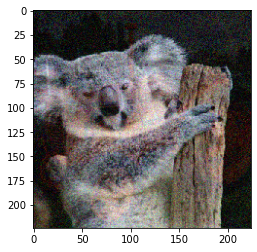

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 7984.366 and class label 866.


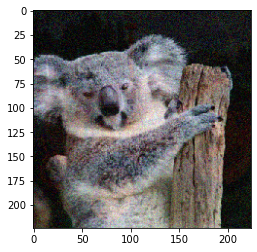

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 90. L2 error 6111.363 and class label 866.


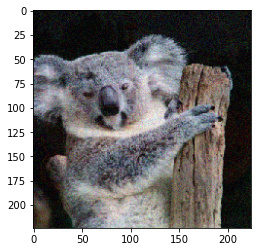

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 100. L2 error 4937.3677 and class label 866.


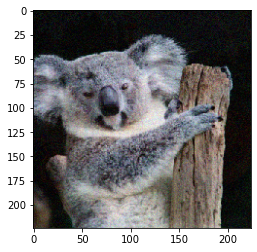

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 110. L2 error 4283.66 and class label 866.


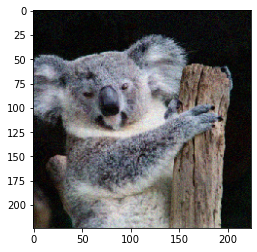

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 120. L2 error 3661.5942 and class label 866.


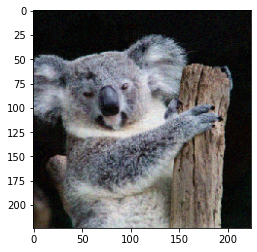

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 130. L2 error 3250.4424 and class label 866.


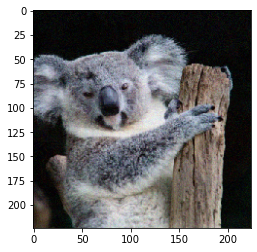

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 140. L2 error 2898.881 and class label 866.


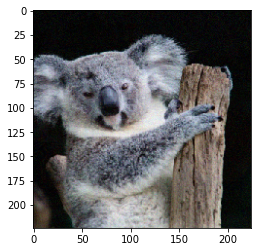

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 150. L2 error 2611.3223 and class label 866.


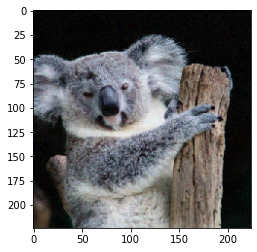

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 160. L2 error 2363.1802 and class label 866.


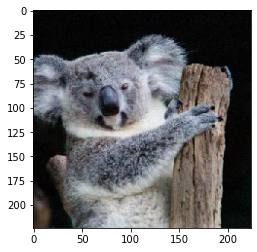

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 170. L2 error 2169.1401 and class label 866.


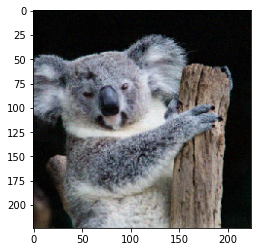

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 180. L2 error 1990.094 and class label 866.


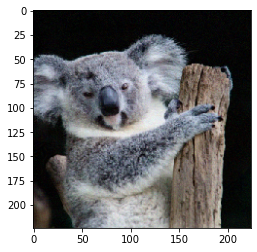

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 190. L2 error 1827.058 and class label 866.


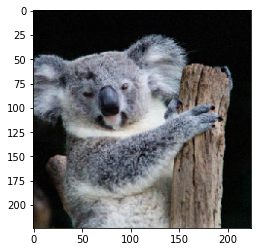

In [7]:
attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
iter_step = 10
x_adv = np.array([init_image])
mask = np.random.binomial(n=1, p=0.9, size=np.prod(target_image.shape))
mask = mask.reshape(target_image.shape)
for i in range(20):
    x_adv = attack.generate(
        x=np.array([target_image]), y=to_categorical([866], 1000), x_adv_init=x_adv, resume=True, mask=mask
    )

    #clear_output()
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
          "and class label %d." % np.argmax(classifier.predict(x_adv)[0]))
    plt.imshow(x_adv[0].astype(np.uint))
    plt.show(block=False)
    
    attack.max_iter = iter_step

# Unsquared Images

HopSkipJump attack supports inputs of unsquared images. The code in the following cell describes an example of creating a Resnet50-based classifier to attack unsquared images.

```python
# Adjust image shape here
image_shape = (224, 150)

mean_imagenet = np.zeros(tuple(list(image_shape) + [3]))
mean_imagenet[...,0].fill(103.939)
mean_imagenet[...,1].fill(116.779)
mean_imagenet[...,2].fill(123.68)

model = ResNet50(weights='imagenet', input_shape=tuple(list(image_shape) + [3]), include_top=False)

def _kr_initialize(_, dtype=None):
    return k.variable(value=np.random.randn(np.prod(list(model.output.shape)[1:]).value, 1000))

head = model.output
head = Flatten()(head)
head = Dense(1000, kernel_initializer=_kr_initialize, bias_initializer=keras.initializers.Zeros())(head)
new_model = Model(inputs=model.input, outputs=head)

classifier = KerasClassifier(clip_values=(0, 255), model=new_model, preprocessing=(mean_imagenet, 1))
# Then call classifier.fit() to train the new weights
```